<a href="https://colab.research.google.com/github/fellipe753/An-lise-Explorat-ria-Airbnb---New-York/blob/main/Analisando_os_Dados_do_Airbnb_NY.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Análise dos Dados do Airbnb - *Nova York*

<img alt="Colaboratory logo" width="15%" src="https://raw.githubusercontent.com/carlosfab/escola-data-science/master/img/novo_logo_bg_claro.png">

#### **Data Science na Prática 3.0**
*by [sigmoidal.ai](https://sigmoidal.ai)*

O [Airbnb](https://www.airbnb.com.br/) já é considerado como sendo a **maior empresa hoteleira da atualidade**. Ah, o detalhe é que ele **não possui nenhum hotel**!

Conectando pessoas que querem viajar (e se hospedar) com anfitriões que querem alugar seus imóveis de maneira prática, o Airbnb fornece uma plataforma inovadora para tornar essa hospedagem alternativa.

No final de 2018, a Startup fundada 10 anos atrás, já havia **hospedado mais de 300 milhões** de pessoas ao redor de todo o mundo, desafiando as redes hoteleiras tradicionais.

Uma das iniciativas do Airbnb é disponibilizar dados do site, para algumas das principais cidades do mundo. Por meio do portal [Inside Airbnb](http://insideairbnb.com/get-the-data.html), é possível baixar uma grande quantidade de dados para desenvolver projetos e soluções de *Data Science*.

<center><img alt="Analisando Airbnb" width="10%" src="https://www.area360.com.au/wp-content/uploads/2017/09/airbnb-logo.jpg"></center>

**Neste *notebook*, iremos analisar os dados referentes à cidade de Nova Iorque nos Estados Unidos da America, e ver quais insights podem ser extraídos a partir de dados brutos.**

Dados do Airbnb compliados em 06/01/2022.

**https://github.com/fellipe753/portfolio**

# 1 - Obtenção dos Dados


In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import folium
import folium.plugins as plugins
%matplotlib inline

In [2]:
# import dos dados direto do site de database do airnb
df = pd.read_csv("http://data.insideairbnb.com/united-states/ny/new-york-city/2022-01-06/visualisations/listings.csv")

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (17) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


# 2 - Tratamento dos Dados


## 2.1 - Dicionário das variáveis

* `id` - número de id gerado para identificar o imóvel
* `name` - nome da propriedade anunciada
* `host_id` - número de id do proprietário (anfitrião) da propriedade
* `host_name` - Nome do anfitrião
* `neighbourhood_group` - nome da região
* `neighbourhood` - nome do bairro
* `latitude` - coordenada da latitude da propriedade
* `longitude` - coordenada da longitude da propriedade
* `room_type` - informa o tipo de quarto que é oferecido
* `price` - preço para alugar o imóvel
* `minimum_nights` - quantidade mínima de noites para reservar
* `number_of_reviews` - número de reviews que a propriedade possui
* `last_review` - data do último review
* `reviews_per_month` - quantidade de reviews por mês
* `calculated_host_listings_count` - quantidade de imóveis do mesmo anfitrião
* `availability_365` - número de dias de disponibilidade dentro de 365 dias
* `number_of_reviews_ltm` - número de avaliações que o imóvel teve nos últimos 365 dias
* `license` - número da licensa/permissão registrada


In [3]:
#@title
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75356,-73.98559,Entire home/apt,150,30,48,2019-11-04,0.33,3,334,0,NaN
1,3831,"Whole flr w/private bdrm, bath & kitchen(pls r...",4869,LisaRoxanne,Brooklyn,Bedford-Stuyvesant,40.68494,-73.95765,Entire home/apt,73,1,409,2021-10-22,4.62,1,214,26,NaN
2,5121,BlissArtsSpace!,7356,Garon,Brooklyn,Bedford-Stuyvesant,40.68535,-73.95512,Private room,60,30,50,2019-12-02,0.33,2,365,0,NaN
3,5136,"Spacious Brooklyn Duplex, Patio + Garden",7378,Rebecca,Brooklyn,Sunset Park,40.66265,-73.99454,Entire home/apt,275,5,2,2021-08-08,0.02,1,152,1,NaN
4,5178,Large Furnished Room Near B'way,8967,Shunichi,Manhattan,Midtown,40.76457,-73.98317,Private room,68,2,514,2021-12-21,3.33,1,198,40,NaN


## 2.2 - Tratando Variáveis e Nulos

Verificando valores nulos e removendo colunas/linhas.

In [4]:
#@title
# identificar o volume de dados do DataFrame
print("Entradas:\t {}".format(df.shape[0]))
print("Variáveis:\t {}\n".format(df.shape[1]))

display(df.dtypes)

Entradas:	 38185
Variáveis:	 18



id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group                object
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
number_of_reviews_ltm               int64
license                            object
dtype: object

In [31]:
#@title
# ordenar em ordem decrescente as variáveis por seus valores ausentes
print("Percentual de valores nulos por variável (coluna)\n")
(df.isnull().sum() / df.shape[0]).sort_values(ascending=False)

Percentual de valores nulos por variável (coluna)



reviews_per_month                 0.240304
last_review                       0.240304
host_name                         0.001231
name                              0.000367
number_of_reviews_ltm             0.000000
latitude                          0.000000
host_id                           0.000000
neighbourhood_group               0.000000
neighbourhood                     0.000000
room_type                         0.000000
longitude                         0.000000
availability_365                  0.000000
price                             0.000000
minimum_nights                    0.000000
number_of_reviews                 0.000000
calculated_host_listings_count    0.000000
id                                0.000000
dtype: float64

In [6]:
#@title
# removendo a variável license, que não possui valores.
df = df.drop('license',1)

## 2.3 - Histograma Variáveis Numéricas

Ilustração das variáveis númericas antes do tratamento de outliers

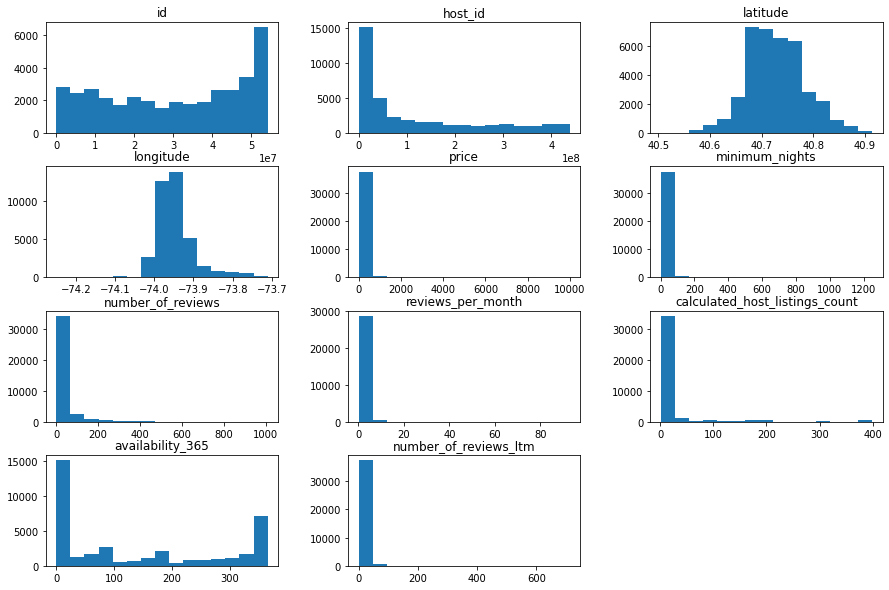

In [7]:
#@title
#primeiro visualizar as variáveis númericas antes do tratamento
df.hist(bins=15, grid=False, figsize=(15,10));

## 2.4 - Tratamento de outliers

Podemos observar que as variáveis price, minimum_nights apresentam mínimos e máximos muitos distantes. 
Por isso, as mesmas serão tratadas para remoção dos outliers.

Foi aplicado um filtro no minimum nights < 90 dias. Desta forma foram removidos 0.95% das informações contidas do dataset (364 linhas).

Também foi aplicado um filtro no price < $1000,00. Amostras acima deste limiar representam 0.71% das amostras (271 linhas).

Como as condições foram aplicadas simultaneamente, no fim tivemos a remoção de xx linhas do dataset.



In [8]:
#@title
# ver o resumo estatístico das variáveis numéricas
df[['price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month',
    'calculated_host_listings_count', 'availability_365']].describe()

,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,38185.000000,38185.000000,38185.000000,29009.000000,38185.000000,38185.000000
mean,159.285714,21.165903,23.800000,1.100220,17.788320,139.818672
std,292.483688,29.024816,51.065326,1.772447,58.000421,145.357261
min,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,68.000000,3.000000,1.000000,0.120000,1.000000,0.000000
50%,109.000000,30.000000,4.000000,0.440000,1.000000,87.000000
75%,175.000000,30.000000,21.000000,1.530000,4.000000,304.000000
max,10000.000000,1250.000000,1010.000000,92.920000,399.000000,365.000000


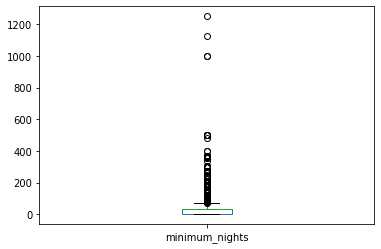

minimum_nights valores acima de 90 noites: 364
Este valor representa 0.95% do total


In [9]:
#@title
# verificando quantas amostras acima de 90 noites
df.minimum_nights.plot(kind='box')
plt.show()

print(f'minimum_nights valores acima de 90 noites: {len(df[df.minimum_nights > 90])}')
print(f'Este valor representa {round((len(df[df.minimum_nights > 90]))/(len(df))*100,2)}% do total')

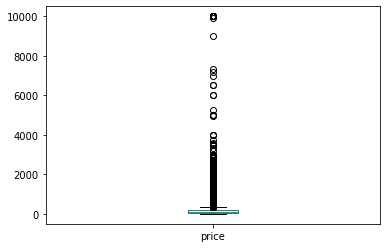

price valores acima de $1000,00: 272
Este valor representa 0.71% do total


In [10]:
#@title
#verificando quantas amostras acima de $1000,00
df.price.plot(kind='box')
plt.show()

print(f'price valores acima de $1000,00: {len(df[df.price > 1000])}')
print(f'Este valor representa {round((len(df[df.price > 1000]))/(len(df))*100,2)}% do total')

In [11]:
#@title
# criando um novo dataframe com os filtros acima aplicados
df_clean = df.copy()
df_clean.drop(df_clean[df_clean.price > 1500].index, axis=0,inplace=True)
df_clean.drop(df_clean[df_clean.minimum_nights > 100].index, axis=0, inplace=True)

## 2.5 Histograma após remoção dos Outliers


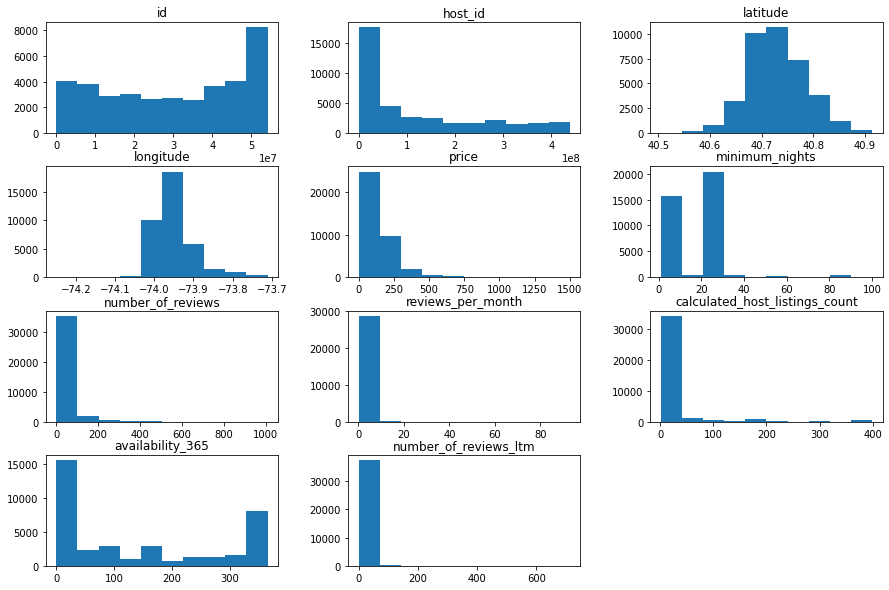

In [12]:
#@title
#histograma limpo
df_clean.hist(bins=10, grid=False, figsize=(15,10));

In [32]:
#@title
df_clean[['price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month',
    'calculated_host_listings_count', 'availability_365']].describe()

,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,37712.000000,37712.000000,37712.000000,28796.000000,37712.000000,37712.000000
mean,146.957759,19.222900,23.993981,1.104889,17.786726,138.609223
std,140.475786,15.670633,51.282401,1.777040,58.260163,144.941017
min,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,67.000000,3.000000,1.000000,0.120000,1.000000,0.000000
50%,109.000000,30.000000,4.000000,0.440000,1.000000,86.000000
75%,175.000000,30.000000,21.000000,1.540000,3.000000,300.250000
max,1500.000000,100.000000,1010.000000,92.920000,399.000000,365.000000


# 3 - Análise dos Dados

## 3.1 - Correlação das Variáveis Numéricas

As únicas variáveis que mostraram uma alta correlção entre si foram: 

    number_of_reviews_ltm e reviews_per_month
Faz sentido, levando em consideração que a primeira variável engloba a segunda em sua contagem.

a variável *number_of_reviews* também apresenta uma correlação parcialmente alta com as outras duas variáveis.

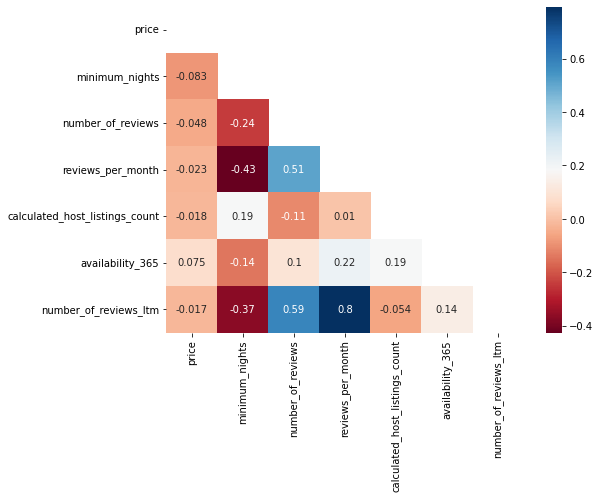

In [14]:
#@title
corrMatrix = df_clean[['price','minimum_nights','number_of_reviews',
                       'reviews_per_month','calculated_host_listings_count',
                       'availability_365','number_of_reviews_ltm']].corr()

mascara = np.triu(corrMatrix)
plt.rcParams["figure.figsize"] = (8,6)
sns.heatmap(corrMatrix, annot=True, mask=mascara, cmap="RdBu");

## 3.2 - Tipo de Imóvel Mais Alugado


In [15]:
#@title
type_imovel = df_clean.room_type.value_counts()
print(f'Percentual por tipo de imóvel:')
display(round(type_imovel/len(df)*100,2))

Percentual por tipo de imóvel:


Entire home/apt    52.63
Private room       44.13
Shared room         1.45
Hotel room          0.54
Name: room_type, dtype: float64

In [33]:
#@title
# fig1, ax1 = plt.subplots()

# ax1.pie(type_imovel, labels=type_imovel.index, autopct='%1.1f%%', startangle=0,
#         colors=['cornflowerblue','lightgreen','gold','gray'])

# plt.show()

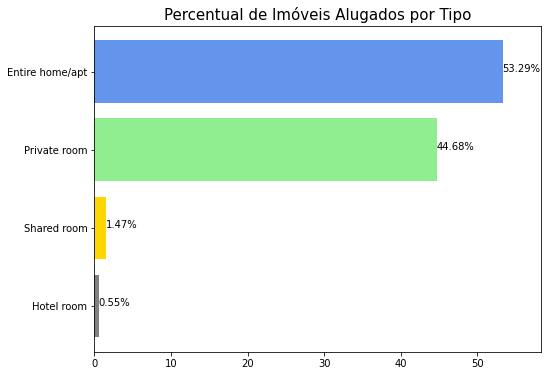

In [17]:
#@title
from numpy.ma.core import size
type_imovel = round(df_clean.room_type.value_counts()/len(df_clean)*100,2).sort_values()
fig, ax = plt.subplots()

ax.barh(type_imovel.index,type_imovel, color=['gray','gold','lightgreen','cornflowerblue'])
ax.set_xlim([0,type_imovel[-1]+5])
plt.title('Percentual de Imóveis Alugados por Tipo', size=15)



for i, v in enumerate(type_imovel):
    plt.text(v, i, str(v)+"%") #+"%" aplicar limite

plt.show()

## 3.3 - Bairros mais caros e requisitados



In [34]:
#@title
#ordenado pelo preço
neigh_price = round(df_clean.groupby(['neighbourhood']).price.mean(),2)
neigh_ocorr = df_clean.neighbourhood.value_counts()
df_neigh = pd.concat([neigh_price, neigh_ocorr], axis=1)
df_neigh.columns = ['preco_medio','total_alugueis']
df_neigh.rename_axis('bairros', inplace=True)
print(f'Temos ao todo {len(df_neigh)} bairros com ao menos um imóvel alugado durante o período.\n')
df_neigh.sort_values(by='preco_medio', ascending=False).head(10)

Temos ao todo 222 bairros com ao menos um imóvel alugado durante o período.



,preco_medio,total_alugueis
bairros,,
Fort Wadsworth,800.00,1
Tribeca,356.15,134
Willowbrook,309.00,1
Navy Yard,303.43,7
Neponsit,295.00,1
SoHo,287.63,243
Tottenville,269.00,2
Flatiron District,266.63,67
Theater District,253.59,270


In [35]:
#@title
print('Bairros que possuem maiores ocorrências de aluguéis.\n')
# ordenado pelo número de alugueis (total_rent)
df_neigh.sort_values(by='total_alugueis', ascending=False).head(10)

Bairros que possuem maiores ocorrências de aluguéis.



,preco_medio,total_alugueis
bairros,,
Bedford-Stuyvesant,113.19,2831
Williamsburg,149.23,2539
Harlem,118.79,1951
Bushwick,93.99,1672
Hell's Kitchen,188.80,1655
Midtown,241.79,1556
Upper West Side,177.47,1464
Upper East Side,179.62,1341
Crown Heights,113.71,1237


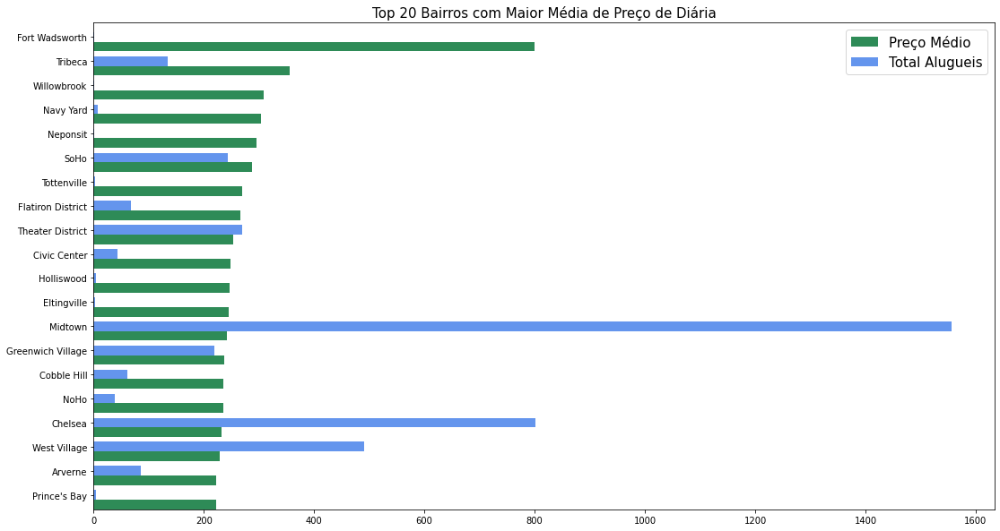

In [37]:
#@title
df_neigh_graph = df_neigh.sort_values(by='preco_medio', ascending=False).head(20)
df_neigh_graph = df_neigh_graph.sort_values(by='preco_medio', ascending=True)
ind = np.arange(len(df_neigh_graph))
width = 0.4

fig, ax = plt.subplots(figsize=(18, 10))

ax.barh(ind, df_neigh_graph.preco_medio, width, label='Preço Médio', color='seagreen')
ax.barh(ind+width, df_neigh_graph.total_alugueis, width, label='Total Alugueis', color='cornflowerblue')
ax.set(yticks=ind + width, yticklabels=df_neigh_graph.index, ylim=[2*width - 1, len(df_neigh_graph)])
ax.set_title('Top 20 Bairros com Maior Média de Preço de Diária', size=15)

ax.legend(prop={"size":15})
plt.show()

## 3.4 Bairros mais Caros e Requisitados sem Outliers

Aqui é removido todas as amostras de bairros que possuem ocorrência menor que 0.1% do total do dataset (37 amostras).

Estre tratamento remove o primeiro, terceiro, quarto e quinto bairros mais caros, que juntos somam apenas 10 ocorrências em um dataset que possui mais de 37 mil ocorrências.


In [39]:
#@title
#maior preço hospedagem
df_neigh_clean = df_neigh.copy()
df_neigh_clean = df_neigh_clean[df_neigh_clean.total_alugueis > (len(df_clean) *0.001) ]
print(f'Após o tratamento, temos ao todo {len(df_neigh_clean)} bairros com ao menos um imóvel alugado durante o período.\n')
df_neigh_clean.sort_values(by='preco_medio', ascending=False).head(10)

Após o tratamento, temos ao todo 106 bairros com ao menos um imóvel alugado durante o período.



,preco_medio,total_alugueis
bairros,,
Tribeca,356.15,134
SoHo,287.63,243
Flatiron District,266.63,67
Theater District,253.59,270
Civic Center,249.02,44
Midtown,241.79,1556
Greenwich Village,237.70,219
Cobble Hill,235.87,61
NoHo,235.05,39


In [40]:
#@title
print('Bairros com o menor preço médio por noite hospedada.\n')
#menor preço médio hospedagem
df_neigh_clean.sort_values(by='preco_medio', ascending=True).head(10)

Bairros com o menor preço médio por noite hospedada.



,preco_medio,total_alugueis
bairros,,
Elmhurst,65.56,250
Woodside,69.89,403
Borough Park,73.83,78
Jackson Heights,76.38,220
Inwood,77.72,208
Midwood,81.80,91
Fordham,84.35,52
Woodhaven,86.03,74
Bensonhurst,86.40,70


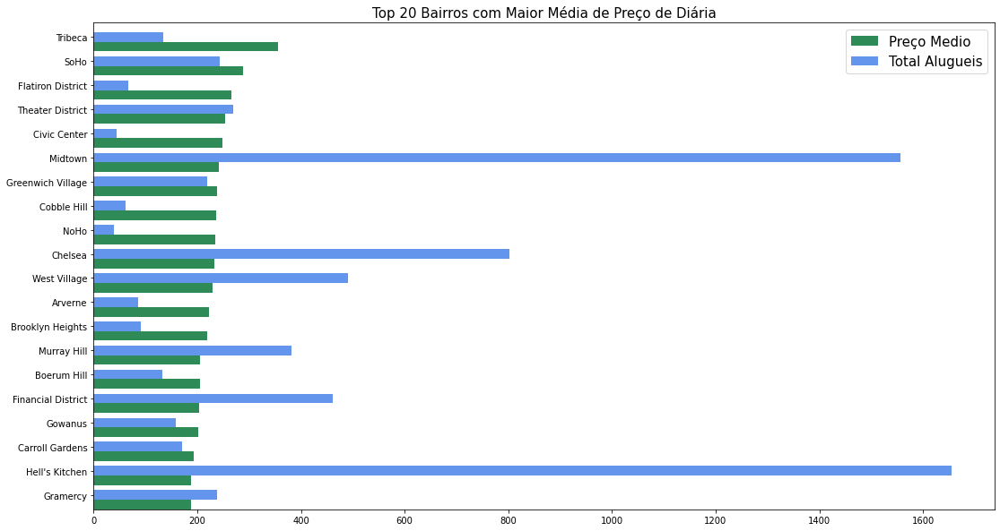

In [42]:
#@title
df_neigh_clean_graph = df_neigh_clean.sort_values(by='preco_medio', ascending=False).head(20)
df_neigh_clean_graph = df_neigh_clean_graph.sort_values(by='preco_medio', ascending=True)
ind = np.arange(len(df_neigh_clean_graph))
width = 0.4

fig, ax = plt.subplots(figsize=(18, 10))

ax.barh(ind, df_neigh_clean_graph.preco_medio, width, label='Preço Medio', color='seagreen')
ax.barh(ind+width, df_neigh_clean_graph.total_alugueis, width, label='Total Alugueis', color='cornflowerblue')
ax.set(yticks=ind + width, yticklabels=df_neigh_clean_graph.index, ylim=[2*width - 1, len(df_neigh_clean_graph)])
ax.set_title('Top 20 Bairros com Maior Média de Preço de Diária', size=15)

ax.legend(prop={"size":15})
plt.show()

In [43]:
#@title
print('Bairros que possuem maiores ocorrências de aluguéis.\n')
#bairro mais requisitado
df_neigh_clean.sort_values(by='total_alugueis', ascending=False).head(10)

Bairros que possuem maiores ocorrências de aluguéis.



,preco_medio,total_alugueis
bairros,,
Bedford-Stuyvesant,113.19,2831
Williamsburg,149.23,2539
Harlem,118.79,1951
Bushwick,93.99,1672
Hell's Kitchen,188.80,1655
Midtown,241.79,1556
Upper West Side,177.47,1464
Upper East Side,179.62,1341
Crown Heights,113.71,1237


In [44]:
#@title
print('Bairros que possuem menores ocorrências de aluguéis.\n')
df_neigh_clean.sort_values(by='total_alugueis', ascending=True).head(10)

Bairros que possuem menores ocorrências de aluguéis.



,preco_medio,total_alugueis
bairros,,
Parkchester,110.42,38
NoHo,235.05,39
Fresh Meadows,135.05,40
Far Rockaway,169.48,40
Two Bridges,126.02,41
St. George,92.52,42
Civic Center,249.02,44
Williamsbridge,94.00,45
Concourse,100.67,45


## 3.5 - Distritos mais caros e requisitados

In [45]:
#@title
print('Distritos com o maior preço médio por noite hospedada.\n')

neigh_group_price = round(df_clean.groupby(['neighbourhood_group']).price.mean(),2)
neigh_group_ocorr = df_clean.neighbourhood_group.value_counts()
df_neigh_group = pd.concat([neigh_group_price, neigh_group_ocorr], axis=1)
df_neigh_group.columns = ['price','total_rent']
df_neigh_group = df_neigh_group.sort_values(by='price', ascending=False)
df_neigh_group

Distritos com o maior preço médio por noite hospedada.



,price,total_rent
Manhattan,181.24,16319
Brooklyn,128.47,14538
Staten Island,116.71,339
Queens,104.73,5398
Bronx,100.10,1118


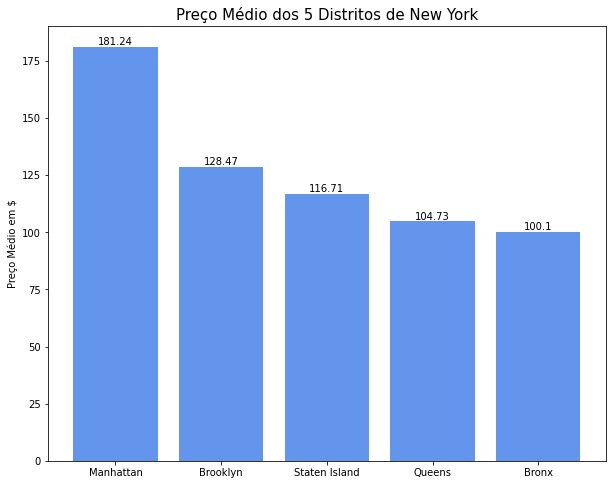

In [53]:
#@title
df_neigh_group = df_neigh_group.sort_values(by='price', ascending=False)

plt.figure(figsize=(10,8))
plt.bar(df_neigh_group.index, df_neigh_group.price, color='cornflowerblue')

for i in range(len(df_neigh_group)):
  plt.text(i, df_neigh_group.price[i], df_neigh_group.price[i], ha='center', va='bottom')

plt.ylabel("Preço Médio em $")
plt.title("Preço Médio dos 5 Distritos de New York", size=15)

plt.show()

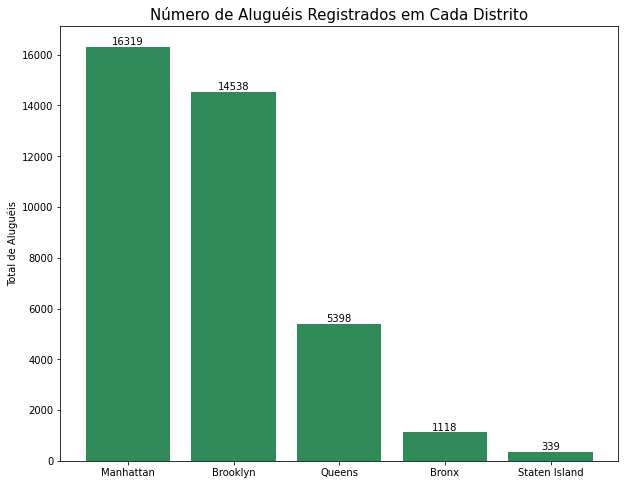

In [52]:
#@title
df_neigh_group = df_neigh_group.sort_values(by='total_rent', ascending=False)

plt.figure(figsize=(10,8))
plt.bar(df_neigh_group.index, df_neigh_group.total_rent, color='seagreen')

for i in range(len(df_neigh_group)):
  plt.text(i, df_neigh_group.total_rent[i], df_neigh_group.total_rent[i], ha='center', va='bottom')

plt.ylabel("Total de Aluguéis")
plt.title("Número de Aluguéis Registrados em Cada Distrito", size=15)

plt.show()

## 3.6 - Mapa Ocorrências x Preço Aluguel

Abaixo é ilustrado um mapa que plota cada imóvel e o colore de acordo com o preço do seu aluguel.

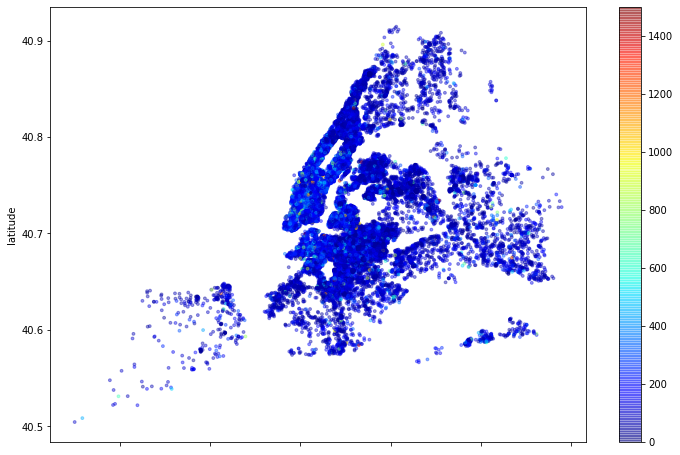

In [47]:
#@title
df_clean.plot(kind="scatter", x='longitude', y='latitude', alpha=0.4, c=df_clean['price'], s=8,
              cmap=plt.get_cmap('jet'), figsize=(12,8));

## 3.7 Mapa Ocorrencia por Bairro

O mapa ilustra quantidade de alugueis que um bairo ou região teve no dataset.

O mapa é interativo, podendo aumentar e diminuir o zoom.

In [48]:
#@title
mapa = folium.Map(location=[40.684515988295615, -73.94313526661622],zoom_start=11) #inicia o mapa com as coordenadas escolhidas
coordenadas= []

for lat, lng in zip(df_clean.latitude, df_clean.longitude):
    coordenadas.append([lat,lng])

mapa.add_child(plugins.MarkerCluster(coordenadas))
mapa

## 4 - Conclusão

Por meio da análise foi possível identificar os tipos de imóveis mais alugados, bairros mais requisitados, seus preços médios e que a média de noites mínima para aluguel costuma ser em torno de 19.



Estas informações podem enriquecer uma tomada de decisão relacionada à qual lugar se hospedar em New York, mas não deve ser o único motivador. Localização da hospedagem, facilidades de transporte, segurança, opções de lazer e alimentação também são de extrema importância para se decidir o local de sua estadia.